# Analysis Notebook
## Import Block
Though simple, it is important to know which modules, as well as specific packages within the modules, are needed. Those that were necessary for this assignment are as follows:

In [231]:
import numpy as np
from astropy.io import fits
%matplotlib inline
from matplotlib import pyplot as plt
from astropy.visualization import hist
import ccdproc as ccdp
from matplotlib import rc
from datetime import datetime
from astropy.nddata import CCDData

phot_tutorial_dir ="/Users/jonathanrodriguez/Documents/ASTR8060/repos/phot_tutorial/ccd-reduction-and-photometry-guide/notebooks/"
import sys
sys.path.insert(0,phot_tutorial_dir)
from convenience_functions import show_image

plt.style.use(phot_tutorial_dir+'/guide.mplstyle')

# Set some default parameters for the plots below
rc('font', size=12)
rc('axes', grid=True)

## For Fitting Models
These are the fitting models that can be used for this assignment. 

In [2]:
from astropy.modeling import fitting
from astropy.modeling.models import Polynomial1D,Chebyshev1D,Legendre1D

## Define Directories
We are assigning variables to the directories which contain the data in data_dir. The same data exists in reduced_dir, however it's in this variable that we will be reducing the data. 

In [3]:
data_dir = '/Users/jonathanrodriguez/Documents/ASTR8060/Imaging'
reduced_dir = '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions'

# Create Bias Filenames Array
Here, we use a for loop to create an array of all of the bias filenames that will be used during this assignment. Next, we use list comprehension to open all the bias files and their respective header information. "hdus" opens the fits files in a for loop, "hdrs" lists out the header information of each file, and "biases" lists out the data within each bias file as an array. 

In [74]:
bias_files = [reduced_dir+'/a'+str(i).zfill(3)+'.fits' for i in np.arange(19)+(93)]
hdus = [fits.open(file) for file in bias_files]
hdrs = [hdu[0].header for hdu in hdus]
biases = [hdu[0].data for hdu in hdus]

Since "hdus" has a size of 19, we can use a for loop to assign the boundaries of the bias section (biassec) and the trim section (trim section) of each bias file. This is a process of reducing the images. In this for loop, we also assign the filter type and image type to "None" and "Bias", respectfully. We also make sure that we write out the entire HDU using the ".writeto" function. 

In [12]:
for i in range(np.size(hdus)):
    print(i) #this shows that the for loop is iterating across the correct number. 
    hdrs[i]['BIASSEC'] = '[2102:2200, 0:2048]'
    hdrs[i]['TRIMSEC'] = '[51:2102, 0:2048]'  
    hdrs[i]['FILTER'] = 'None'
    hdrs[i]['IMAGETYP'] = 'Bias'

     
    hdus[i].writeto(bias_files[i], overwrite = True)
    
del hdus # hdus take a lot of memory, don't leave them open when you don't need to
del hdrs

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


## Read in the a093 Bias Frame
The way one can read in a specific file is shown below:

In [31]:
a093b = reduced_dir+"a093.fits"

We create a new variable called "bias" in order to create an array of ones that has the same shape of 1 bias image. In this case, we are taking the very first bias image in the list. 

In [167]:
bias = np.ones(np.shape(biases[0])[0:]) # this placeholder is an array of ones shaped like your images
print(bias)
bias = biases[0]
print(bias)

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]
[[687 690 686 ... 659 663 658]
 [662 659 635 ... 681 645 662]
 [658 664 635 ... 673 665 655]
 ...
 [659 660 633 ... 664 638 659]
 [655 662 637 ... 659 670 660]
 [670 667 639 ... 644 655 668]]
(2048, 2200)


In this section, we are defining the trimsec and overscan regions. In order to do this accurately, we open a flat image in DS9, and move the cursor over to the borders of the trimsec and overscan regions. The respective rows and columns are listed below:

In [32]:
lo_trim_row1 = 0    
hi_trim_row1 = 2048 
lo_trim_col2 = 55   
hi_trim_col2 = 2102 

low_center_row1 = 1010
hi_center_row1 = 1020
low_center_col2 = 1116
hi_center_col2 = 1148

lo_overscan_row1 = 0
hi_overscan_row1 = 2048
lo_overscan_col2 = 2102     
hi_overscan_col2 = 2200     

After this, we use the rows and columns of the overscan regions in order to find the mean and median bias values. Python does this by collapsing the columns in the overscan region into one specific "mean" or "median" value. Either method works, however certain situations may require one method over the other. For the purposes of this assignment, the mean is preferred, especially since it has a smaller rms. I also calculated the rms of a region near the center of the chip. 

In [204]:
bias_mn = np.mean(bias[lo_overscan_row1:hi_overscan_row1,lo_overscan_col2:hi_overscan_col2],axis=1)
print(np.shape(bias))
print(np.shape(bias_mn))
bias_md = np.median(bias[lo_overscan_row1:hi_overscan_row1,lo_overscan_col2:hi_overscan_col2],axis=1)
bias_center_mn = np.mean(bias[low_center_row1:hi_center_row1,low_center_col2:hi_center_col2],axis=1)
print('The mean has smaller rms ({0:4.2f}) than the median ({1:4.2f}).'.format(np.std(bias_mn),np.std(bias_md)))
print('A region near the center of the chip has an rms of ({0:4.2f}).'.format(np.std(bias_center_mn)))

(2048, 2200)
(2048,)
The mean has smaller rms (0.40) than the median (0.48).
A region near the center of the chip has an rms of (0.85).


## Plotting the Average Values of the Overscan Region
Here, we are plotting the mean and median bias values in the overscan regions. After plotting both, we see that the median only has integer values, with the exception of certain outliers. In order to get a true depiction of the average values, the mean bias values are prefered. 

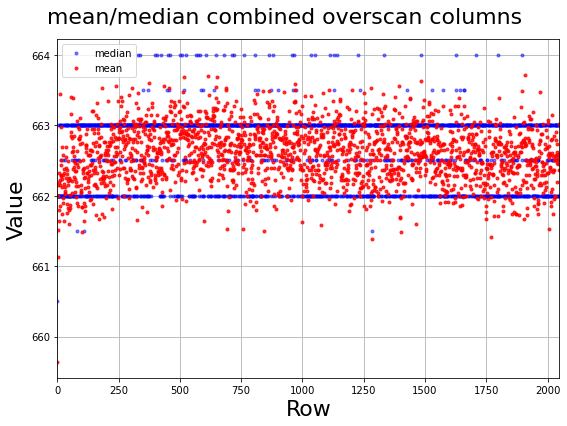

In [26]:
# plot the mean and median bias value in the overscan region
### make an array for the rows

rows_in_overscan = np.shape(bias_mn)[0] # how many rows are in the overscan region?
rows = np.arange(rows_in_overscan)
# make the plot
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(rows,bias_md,".b",label='median',alpha=0.5)#ls='-',c='b',label='median',alpha=0.5)
ax.plot(rows,bias_mn,".r",label='mean',alpha=0.8)#ls='-',c='r',label='mean',alpha=0.8)
ax.legend()
ax.set_xlabel(r'Row',fontsize=22)
ax.set_ylabel(r'Value',fontsize=22)
ax.set_xlim([0,2048])
fig.suptitle('mean/median combined overscan columns', fontsize=22)
fig.tight_layout()
plt.grid("on")
plt.show()

There are many minimization methods available, so for now I will only use the LinearLSQFitter method. I also chose the Legendre1D model, and took it to be a 0 degree polynomial. When we plot the data, we see the difference between the model and the actual data. Changing the degree will change the resulting fit of the model. 

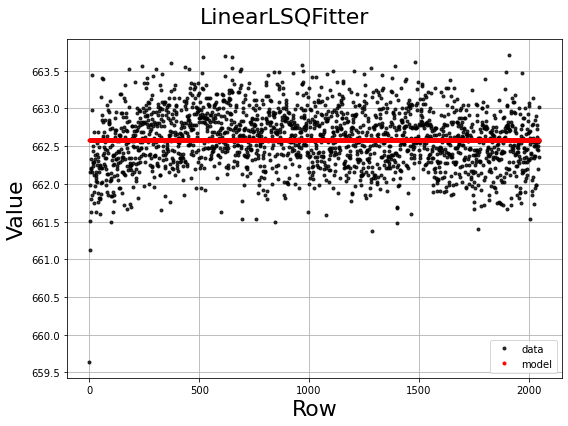

In [30]:
fitter1 = fitting.LinearLSQFitter()
degree = 0 # this will be a constant
model = Legendre1D(degree)
xvals = rows
yvals = bias_mn
wgts  = np.ones_like(bias_mn) # weight all the same
best_fit1 = fitter1(model, xvals, yvals, weights=wgts)    

fig, ax = plt.subplots(figsize=(8,6))
ax.plot(xvals,yvals,".k",label='data',alpha=0.8)#ls='-',c='k',label='data',alpha=0.8)
ax.plot(xvals,best_fit1(xvals),".r",alpha=1,label='model')#ls='-',lw=2,c='r',alpha=1,label='model')
ax.legend()
ax.set_xlabel(r'Row',fontsize=22)
ax.set_ylabel(r'Value',fontsize=22)
fig.suptitle('LinearLSQFitter', fontsize=22)
fig.tight_layout()
plt.grid("on")
plt.show()

Many more amalgamations of tools can be used in the future to accomplish the same or similar tasks. These can be found in the Jupyter notebooks inside the class repository. 

# Continuation of Homework Number 4

## Number 5:

Though we are supposed to be examining all files, I first wanted to compare the overscan regions of some flat images in the V filter to see if there is a noticeable trend. 

In [336]:
flat_files = [reduced_dir+'/a'+str(i).zfill(3)+'.fits' for i in np.arange(7)+(43)] #This is similar to what we did for the bias images. 
flat_files
hdus1 = [fits.open(file) for file in flat_files]
hdrs1 = [hdu[0].header for hdu in hdus1]
flats = [hdu[0].data for hdu in hdus1]

In [370]:
print(flats) #Checking to see if the code above worked the same as it did for the biases. 

[array([[  0, 699, 665, ..., 662, 663, 663],
       [668, 663, 651, ..., 683, 665, 679],
       [665, 667, 644, ..., 632, 665, 668],
       ...,
       [669, 690, 643, ..., 670, 671, 668],
       [645, 678, 644, ..., 669, 644, 639],
       [667, 670, 646, ..., 667, 674, 666]], dtype=uint16), array([[  0, 695, 683, ..., 640, 657, 652],
       [657, 667, 627, ..., 656, 665, 658],
       [654, 664, 630, ..., 671, 657, 661],
       ...,
       [642, 665, 637, ..., 663, 658, 667],
       [657, 663, 639, ..., 686, 662, 665],
       [665, 663, 644, ..., 661, 669, 662]], dtype=uint16), array([[  0, 698, 679, ..., 665, 652, 658],
       [656, 658, 613, ..., 662, 663, 659],
       [639, 667, 631, ..., 667, 662, 641],
       ...,
       [669, 670, 664, ..., 662, 668, 675],
       [680, 664, 642, ..., 666, 644, 671],
       [664, 663, 654, ..., 669, 665, 665]], dtype=uint16), array([[  0, 699, 673, ..., 655, 659, 670],
       [649, 653, 632, ..., 668, 662, 660],
       [658, 675, 634, ..., 648, 66

In [337]:
for i in range(np.size(hdus1)):
    print(i) 
    hdrs1[i]['BIASSEC'] = '[2102:2200, 0:2048]'
    hdrs1[i]['TRIMSEC'] = '[51:2102, 0:2048]'  
    hdrs1[i]['FILTER'] = 'V'
    hdrs1[i]['IMAGETYP'] = 'skyflat'
    hdus1[i].writeto(flat_files[i], overwrite = True)
    
del hdus1 
del hdrs1

0
1
2
3
4
5
6


In [338]:
# put all of the fits files in an image collection
# this is just CCDPROC's way of storing information for groups of fits images
imgs = ccdp.ImageFileCollection(reduced_dir,glob_include='a*.fits') 

In [341]:
# select all the flats
# you won't need these lines now, but they're handy
flat_files = imgs.files_filtered(imagetyp='skyflat',include_path=True)
bands = imgs.filter(imagetyp='skyflat').summary['filter'].data.data 
band = set(imgs.filter(imagetyp='skyflat').summary['filter'].data.data) 


v_files = imgs.files_filtered(imagetyp='skyflat',filter='V',include_path=True) #This is extracting the v-band flats from all other flats.
v_files = v_files[6:]
v_files

['/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a043.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a044.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a045.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a046.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a047.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a048.fits',
 '/Users/jonathanrodriguez/Documents/ASTR8060/Reductions/a049.fits']

In [311]:
lo_trim_row1 = 0    
hi_trim_row1 = 2048 
lo_trim_col2 = 0   
hi_trim_col2 = 2200 



bias1 = np.ones(np.shape(biases)[0:])
bias1 = biases

biases_each = [] #setting up an empty list for each mean value to eventually go into
for i in bias1:
    a = 0
    for j in i: #for each element within each element of bias1
        a = a + j 
    biases_mean = np.mean(i[lo_trim_row1:hi_trim_row1,lo_trim_col2:hi_trim_col2],axis=1) #computing the mean the same way we've done in class, though we iterate over each bias.
    biases_each.append(biases_mean)




IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [353]:
lo_overscan_row1 = 0
hi_overscan_row1 = 2048
lo_overscan_col2 = 2102     
hi_overscan_col2 = 2200

flats1 = np.ones(np.shape(flats)[0:]) #Again, I want to try with just the V-filter flats first. 
flats1 = flats

flats_each = []
for i in flats1:
    a = 0
    for j in i:
        a = a + j
    flats_mean = np.mean(i[lo_overscan_row1:hi_overscan_row1,lo_overscan_col2:hi_overscan_col2],axis=1)
    flats_each.append(flats_mean)

I want to see what the range of mean bias and mean overscan values are. This is to see if there is a noticeable difference between the two. 

In [351]:
b = []
for k in biases_each:
    for l in k:
        b.append(l)
    #if np.any(biases_each[0] < 660):
        #if np.any(k > 668): #just change the sign to < or > if we wanted to be more specific. 
            #b.append(l)
min_bias = (min(b)) #659.0504545454545
max_bias = (max(b)) #669.5245454545454
print(min_bias, max_bias) 

659.0504545454545 669.5245454545454


In [352]:
c = []
for m in flats_each:
    for n in m:
        c.append(n)
    #if np.any(biases_each[0] < 660):
        #if np.any(k > 668): #just change the sign to < or >
            #b.append(l)
min_flats = (min(c)) #658.2142857142857
max_flats = (max(c)) #673.5510204081633
print(min_flats, max_flats)

658.2142857142857 673.5510204081633


### Create a master bias and subtract that from all the images versus using the overscan region of each image as an estimate of the bias level. 
There is a larger variation, though not by much, between the overscan region values rather than the bias frames values. Using the master bias method seems to be a more conservative approach, especially since all of the bias images are taken at a time separate from when the other images are taken. This means the overscan region approach may be a more accurate assessment of the bias level at the time the images were taken. However, because the mean values do not vary by much, I believe either approach is fine. 

## Number 6:

In [355]:
# define the trimsec for python (i.e. not for the fits header)
r0 = 0
r1 = 2048
c0 = 54
c1 = 2101

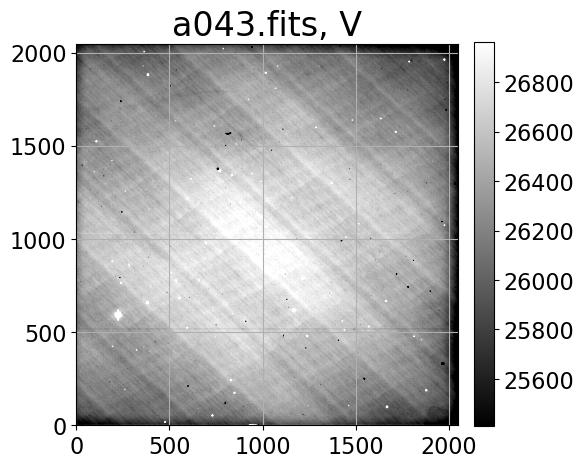

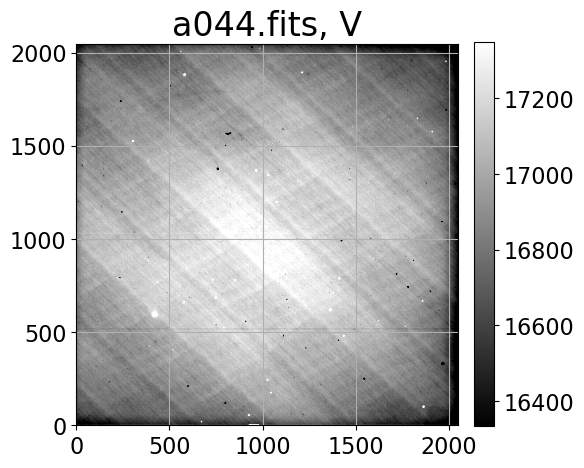

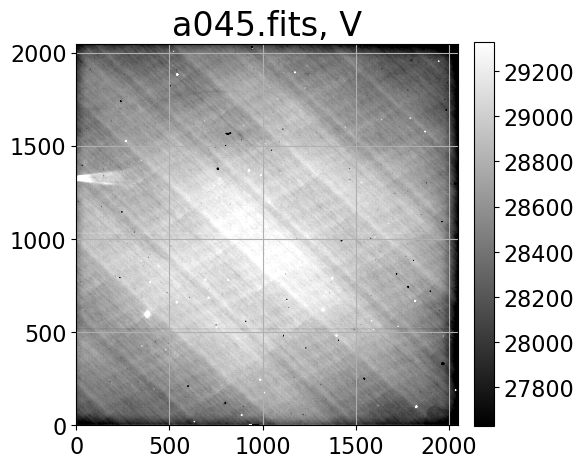

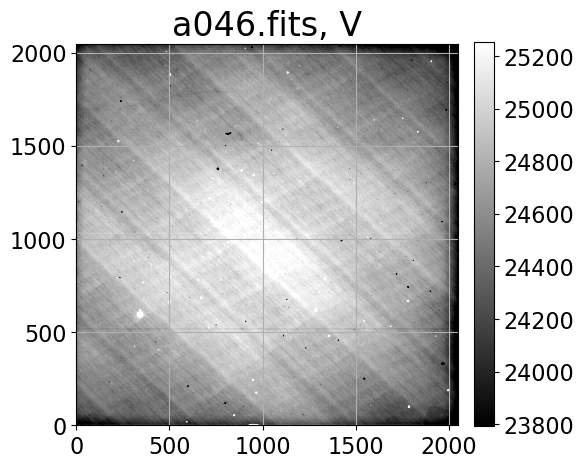

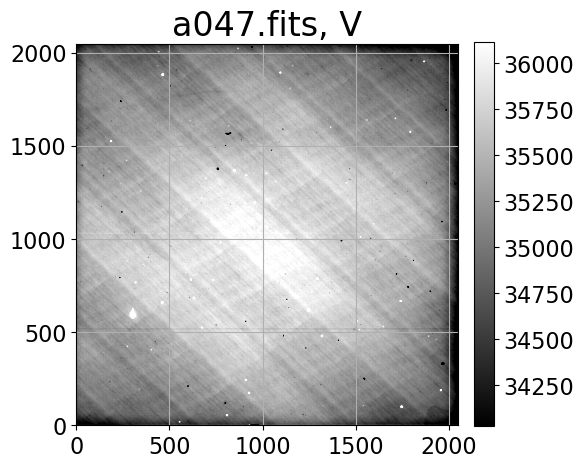

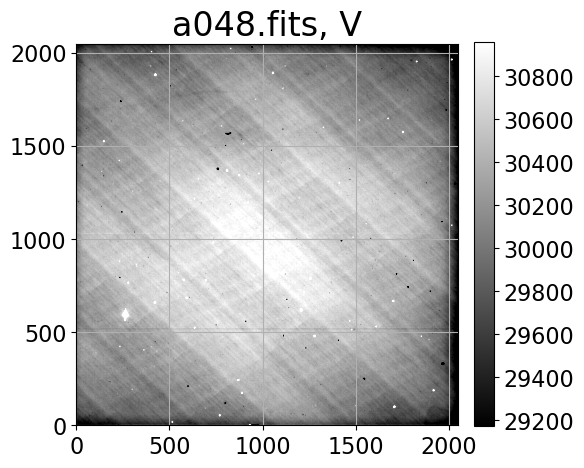

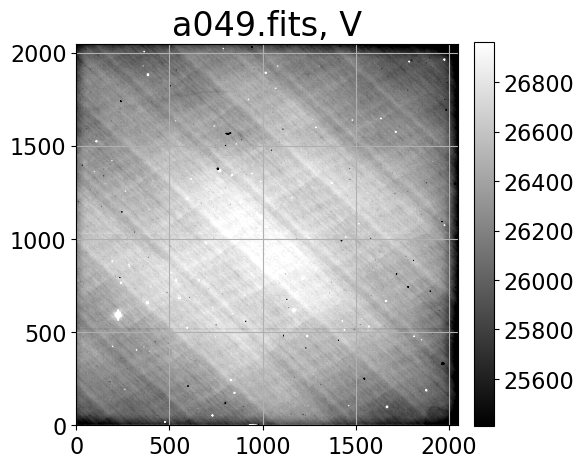

In [357]:
for i in range(7):
    flat = CCDData.read(v_files[i],unit='adu') # this is how CCDPROC reads in one fits image

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    show_image(flat.data[:,c0:c1], cmap='gray', ax=ax, fig=fig)
    ax.set_title(v_files[i][-9:]+', V') # index filename to exclude long directory
    plt.tight_layout()
    plt.show()

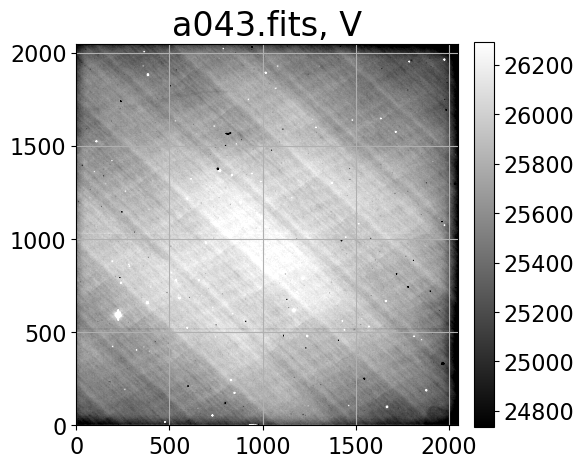

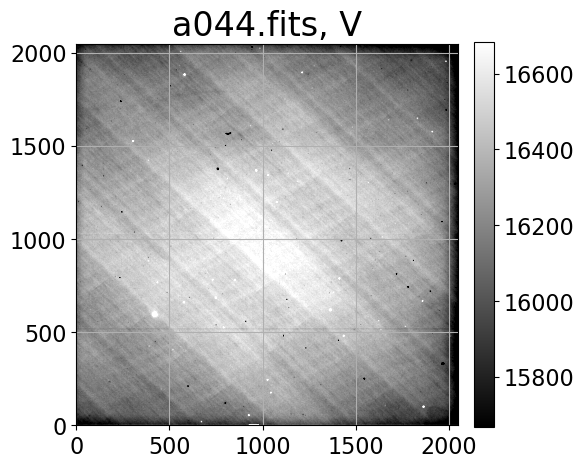

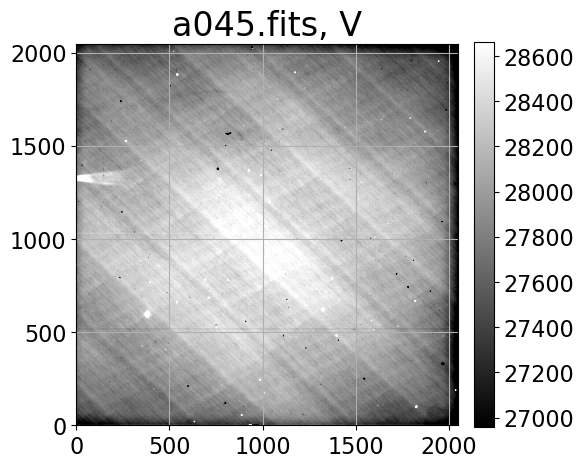

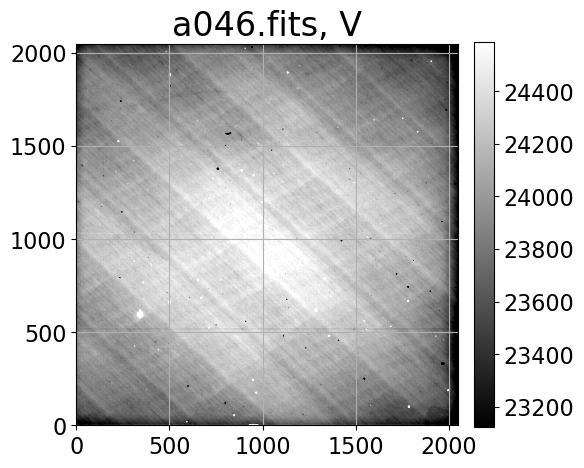

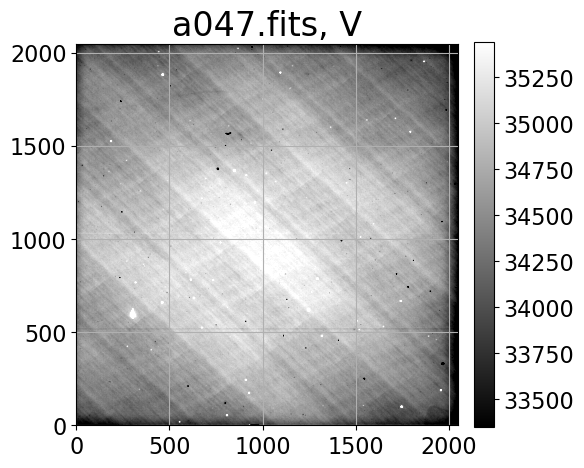

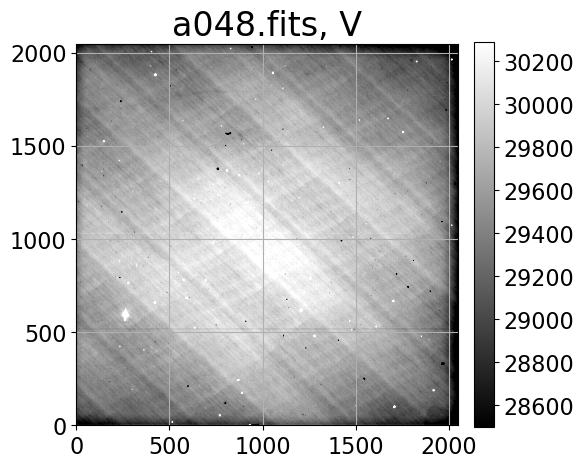

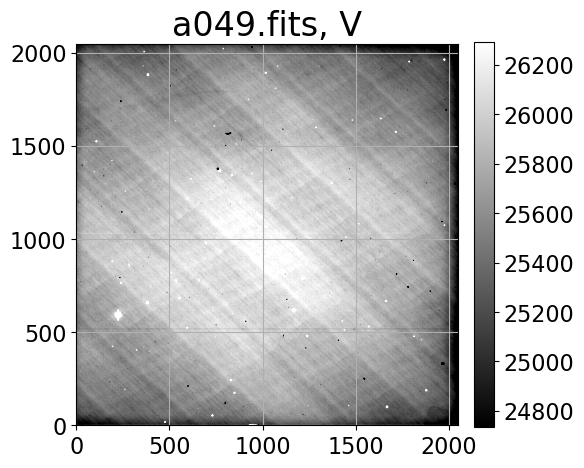

(2048, 2048)


In [408]:
for i in range(7):
    flat = CCDData.read(v_files[i],unit='adu') # this is how CCDPROC reads in one fits image
    flat_noscan = ccdp.subtract_overscan(flat, overscan=flat[:, 2102:2200])
    flat_trimmed = ccdp.trim_image(flat_noscan[:, 54:2102])#[:, :2048])
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    show_image(flat_trimmed, cmap='gray', ax=ax, fig=fig)#.data[:,c0:c1], cmap='gray', ax=ax, fig=fig)
    ax.set_title(v_files[i][-9:]+', V')#[i][-9:]+', V') # index filename to exclude long directory
    plt.tight_layout()
    plt.show()
print(np.shape(flat_trimmed))

#IT WOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOORKS

This is where I started experiencing trouble. I cannot figure out why the flats, after using ccdp.subtract_overscan and ccdp.trim_image, do not show the image properly. I thought it was the cmap that was the issue, but the image comes out as blank, still. I also don't know where I would be subttracting the columns of [0:54].

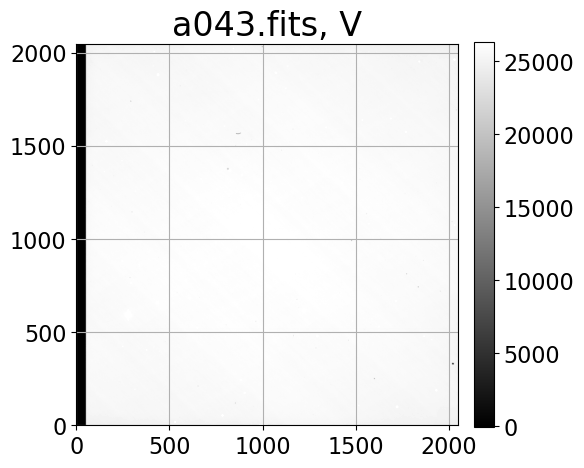

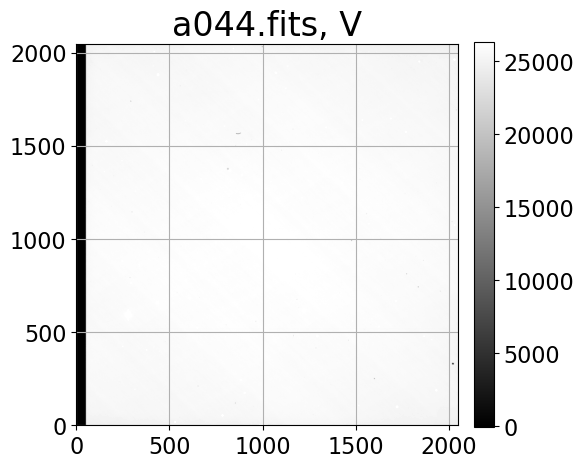

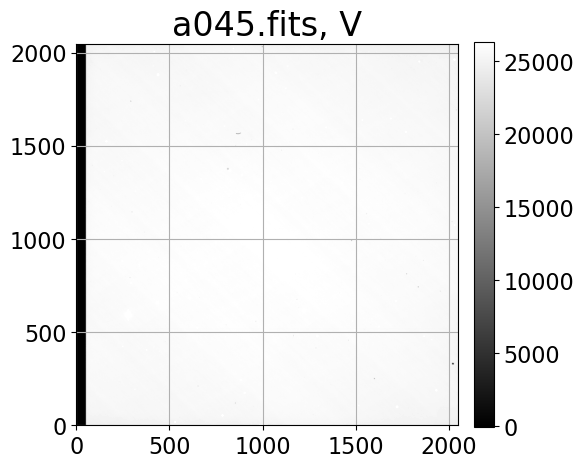

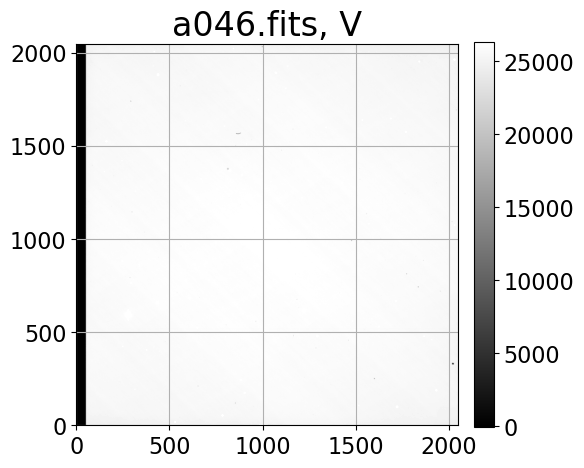

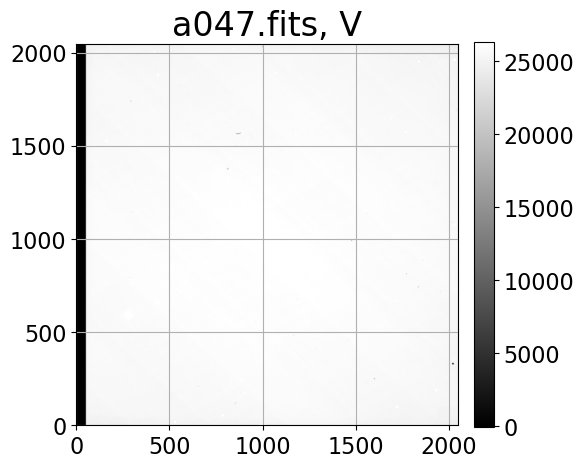

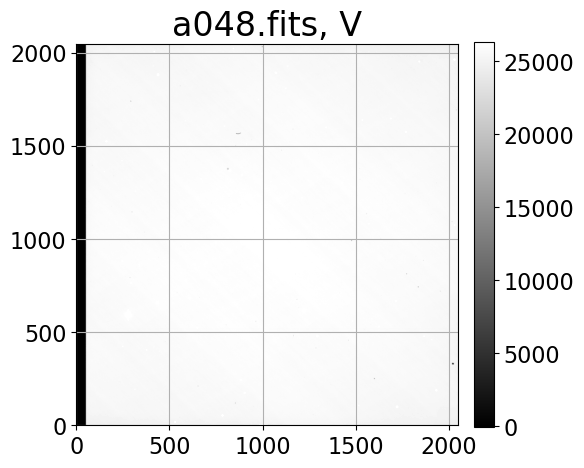

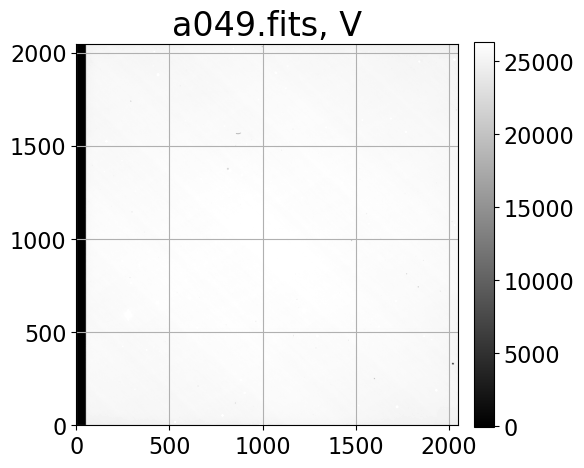

In [375]:
for i in range(7):
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    show_image(flat_trimmed, cmap='gray', ax=ax, fig=fig)#.data[:,c0:c1], cmap='gray', ax=ax, fig=fig)
    ax.set_title(v_files[i][-9:]+', V')#[i][-9:]+', V') # index filename to exclude long directory
    plt.tight_layout()
    plt.show()

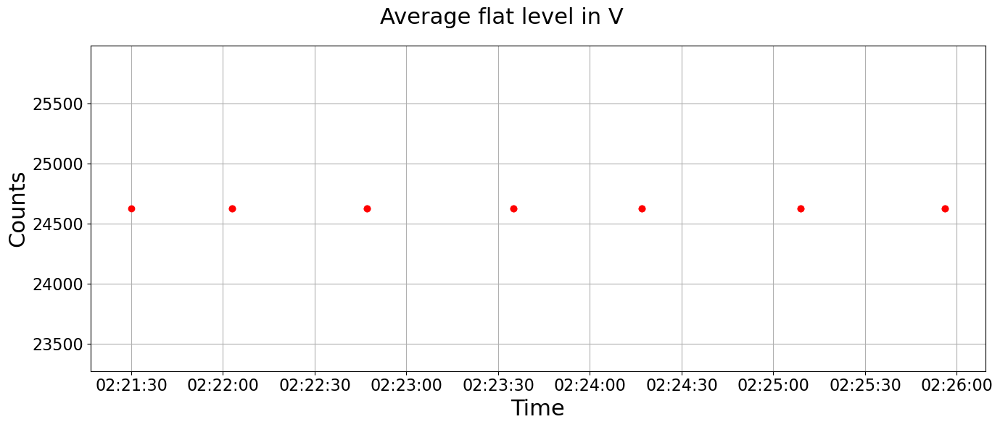

In [376]:
# get obs times, try looking for the 'date-obs' header keyword
times = imgs.filter(imagetyp='skyflat',filter='V').summary['date-obs'].data.data 
flat_times = [datetime.strptime(time,'%Y-%m-%dT%H:%M:%S.%f') for time in times] # these are nicely formatted for plotting

# get the average level in each frame
# use list comprehension to make an array of the V-band flat mean values
# it should have the same length as the flat_tiles variable above
# here are the steps to do this for only the first flat
file_name = v_files[0]
one_flat  = CCDData.read(file_name,unit='adu') # this is CCDPROC's way of reading in fits files
one_mn    = np.mean(one_flat.data)

flat_mn = np.ones_like(flat_times)*one_mn # dummy variable for array of V-band flat mean values

# make the plot
fig, ax = plt.subplots(figsize=(14,6))
ax.plot(flat_times,flat_mn,'red',marker='o',ls='')
ax.set_xlabel(r'Time',fontsize=22)
ax.set_ylabel(r'Counts',fontsize=22)
fig.suptitle('Average flat level in V', fontsize=22)
fig.tight_layout()
plt.show()

This is another area of code that I can't seem to get to work. It worked during class, but it's possible that some of the code I created for this homework is not compatible (or the variables need to be changed) with this code. 

[24625.19157249 15844.17476008 26772.30071644 23058.8022876
 32964.72756858 28266.99952237]
(0,)


ValueError: x and y must have same first dimension, but have shapes (0,) and (6,)

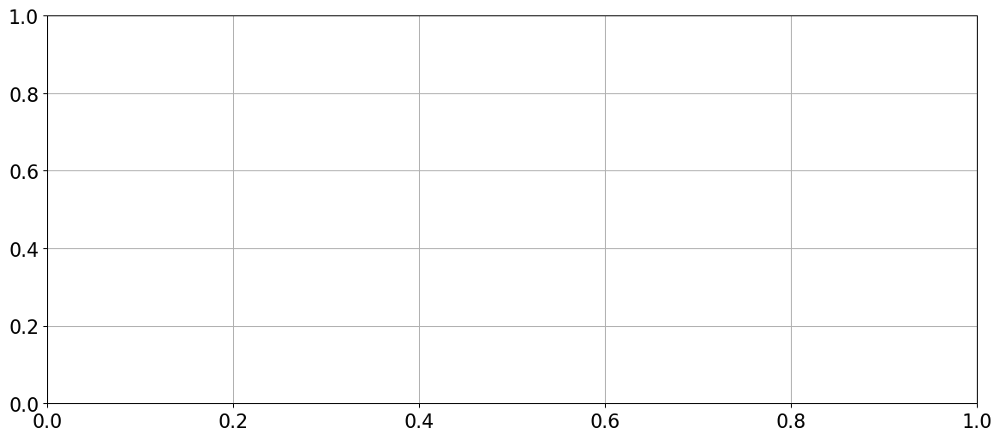

In [385]:
flat_mean = np.zeros(6)
for i in range(6):
    file_names = v_files[i]
    one_flat  = CCDData.read(file_names,unit='adu') # this is CCDPROC's way of reading in fits files
    flat_mean[i]    = np.mean(one_flat.data)

    flat_mn = np.ones_like(flat_times)*one_mn # dummy variable for array of V-band flat mean values
print(flat_mean)
flat_times = flat_times[7:] #THE NUMBER HERE IS THE ISSUE
print(np.shape(flat_times))
# make the plot
fig, ax = plt.subplots(figsize=(14,6))
ax.plot(flat_times,flat_mean,'red',marker='o',ls='')
ax.set_xlabel(r'Time',fontsize=22)
ax.set_ylabel(r'Counts',fontsize=22)
fig.suptitle('Average flat level in V', fontsize=22)
fig.tight_layout()
plt.show()

In [386]:
# you can do this with CCDPROC's combine function:
flat_mn_ccdp = ccdp.combine(v_files,method='average',unit='adu',sigma_clip=False)

# or you can read in the data and do the combine yourself
flats   = [CCDData.read(file_name,unit='adu').data for file_name in v_files]
flat_mn = np.mean(flats,axis=0)   # is that the right number for axis?

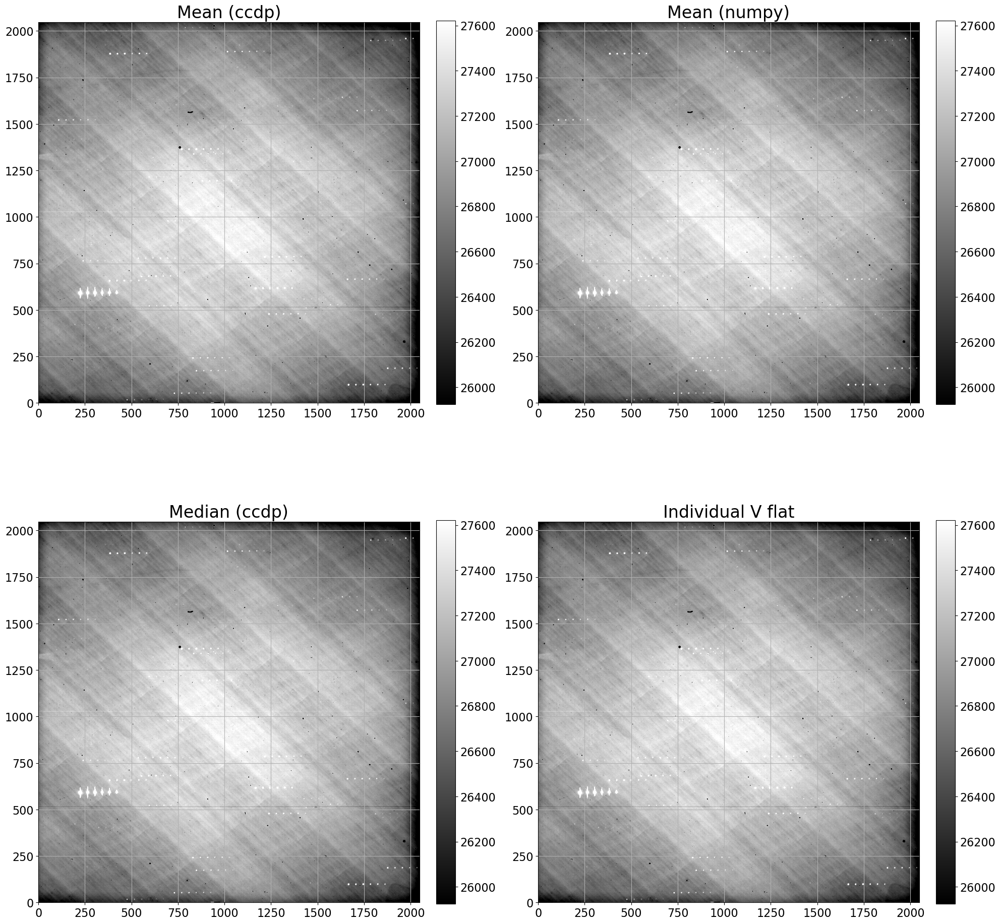

In [387]:
# now plot them
# the titles are suggestions for flats you may want to compare
# you will need to edit the input data arrays, these are mostly placeholders
# try taking the the ccdp-numpy mean flats to see if they are different
fig, (ax1,ax2) = plt.subplots(2, 2, figsize=(20, 20))
show_image(flat_mn_ccdp.data[:,c0:c1], cmap='gray', ax=ax1[0], fig=fig)
ax1[0].set_title('Mean (ccdp)')
show_image(flat_mn[:,c0:c1], cmap='gray', ax=ax1[1], fig=fig)
ax1[1].set_title('Mean (numpy)')
show_image(flat_mn_ccdp.data[:,c0:c1], cmap='gray', ax=ax2[0], fig=fig)
ax2[0].set_title('Median (ccdp)')
show_image(flat_mn[:,c0:c1], cmap='gray', ax=ax2[1], fig=fig)
ax2[1].set_title('Individual V flat')
plt.tight_layout()
plt.show()

In [368]:
files = ccdp.ImageFileCollection(reduced_dir, glob_include = '*.fits')
#raw_biases = files.files_filtered(include_path = True, imagetyp = 'BIAS')
#first_bias = CCDData.read(raw_biases[0], unit = 'adu')
#bias_overscan_subtracted = ccdp.subtract_overscan(first_bias, overscan = first_bias[:, 2055:], median = True)

## Number 7:
The code shown below is borrowed from Jordan, however I have not been able to fix my code above for the few flat files, so I am also unable to use this code for all files. 

In [369]:
for ccd, file_name in files.ccds(ccd_kwargs = {'unit': 'adu'}, return_fname = True):
    ccd = ccdp.subtract_overscan(ccd, overscan = ccd[:, :2101], median = True)
    ccd = ccdp.trim_image(ccd[:, 54:2101])
    outfile = file_name.strip('.fits')+'ot.fits'
    ccd.write(reduced_dir + outfile, overwrite = True)

/Users/jonathanrodriguez/opt/anaconda3/envs/python37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/jonathanrodriguez/opt/anaconda3/envs/python37/lib/python3.7/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


In [388]:
calibrated_biases = files.files_filtered(imagetyp = 'BIAS', include_path = True)
combined_bias = ccdp.combine(calibrated_biases, unit = 'adu', method = 'average', sigma_clip = True, sigma_clip_low_thresh = 5)#,...
combined_bias.meta['combined'] = True
combined_bias.write(reduced_dir + 'combined_bias.fit')

## Number 8 and 9:
Because I was unable to complete the last two numbers, this section is also very difficult for me. 

In [391]:
a03 = fits.open('/Users/jonathanrodriguez/Documents/ASTR8060/Imaging/d011.fits')
a03[0].header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                   16 / Bits per pixel                                 
NAXIS   =                    2 / Number of axes                                 
NAXIS1  =                 2200 / Axis length                                    
NAXIS2  =                 2048 / Axis length                                    
EXTEND  =                    F / File may contain extensions                    
BSCALE  =           1.000000E0 / REAL = TAPE*BSCALE + BZERO                     
BZERO   =           3.276800E4 /                                                
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
DATE    = '2007-10-10T18:19:05' / Date FITS file was generated                  
IRAF-TLM= '12:19:04 (10/10/2007)' / Time of last modification                   
DATAMIN =           6.140000E2 / Minimum data value                             
DATAMAX =           5.325000

In [394]:
dark_files = [reduced_dir+'/d'+str(i).zfill(3)+'.fits' for i in np.arange(15)+(1)] #This is similar to what we did for the flats and bias images. 
dark_files
hdus2 = [fits.open(file) for file in dark_files]
hdrs2 = [hdu[0].header for hdu in hdus2]
dark = [hdu[0].data for hdu in hdus2]

In [396]:
print(dark)

[array([[666, 675, 638, ..., 652, 660, 655],
       [656, 651, 638, ..., 660, 661, 654],
       [656, 658, 637, ..., 657, 662, 653],
       ...,
       [656, 649, 642, ..., 666, 655, 658],
       [651, 655, 630, ..., 657, 665, 660],
       [657, 650, 637, ..., 652, 659, 659]], dtype=uint16), array([[658, 675, 639, ..., 654, 650, 654],
       [658, 656, 631, ..., 661, 658, 658],
       [661, 656, 634, ..., 660, 660, 653],
       ...,
       [660, 653, 637, ..., 657, 659, 665],
       [653, 658, 638, ..., 663, 658, 659],
       [653, 651, 636, ..., 654, 657, 657]], dtype=uint16), array([[676, 679, 638, ..., 654, 656, 664],
       [650, 654, 634, ..., 660, 656, 658],
       [657, 658, 638, ..., 658, 661, 652],
       ...,
       [661, 656, 630, ..., 664, 655, 659],
       [647, 657, 639, ..., 654, 661, 655],
       [656, 651, 630, ..., 657, 656, 657]], dtype=uint16), array([[679, 667, 639, ..., 655, 652, 660],
       [651, 660, 634, ..., 653, 655, 658],
       [654, 652, 640, ..., 662, 66

In [398]:
for i in range(np.size(hdus2)):
    print(i) 
    hdrs2[i]['BIASSEC'] = '[2102:2200, 0:2048]'
    hdrs2[i]['TRIMSEC'] = '[51:2102, 0:2048]'  
    hdrs2[i]['FILTER'] = 'None'
    hdrs2[i]['IMAGETYP'] = 'darks'
    hdus2[i].writeto(dark_files[i], overwrite = True)
    
del hdus2 
del hdrs2

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


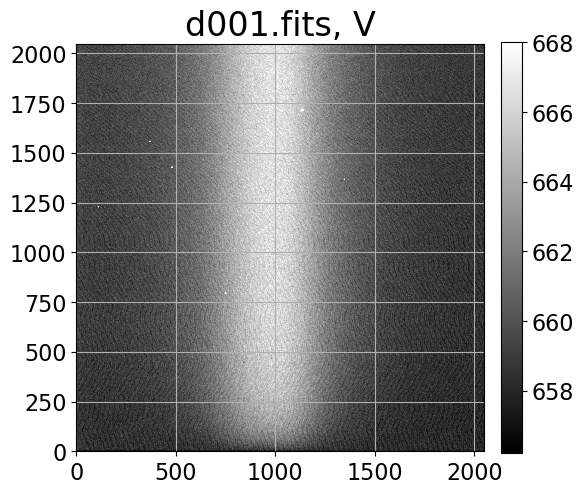

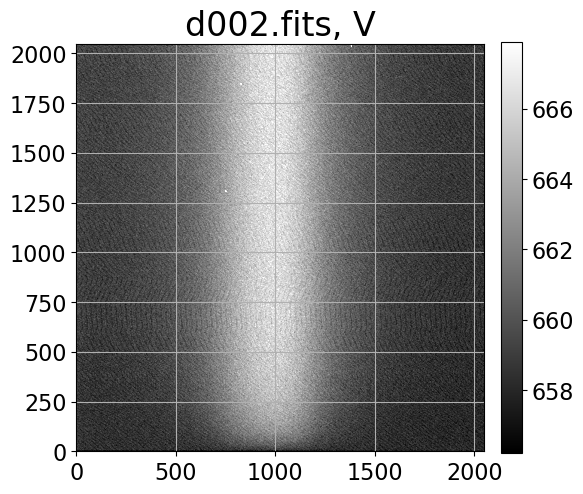

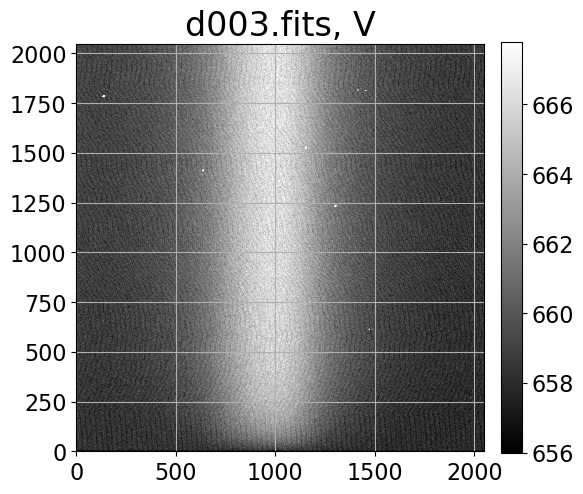

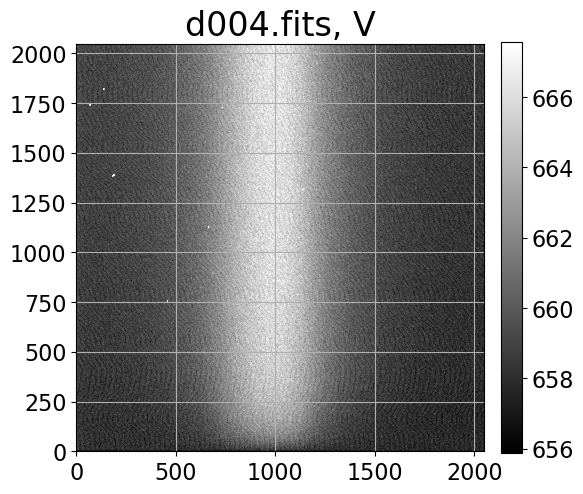

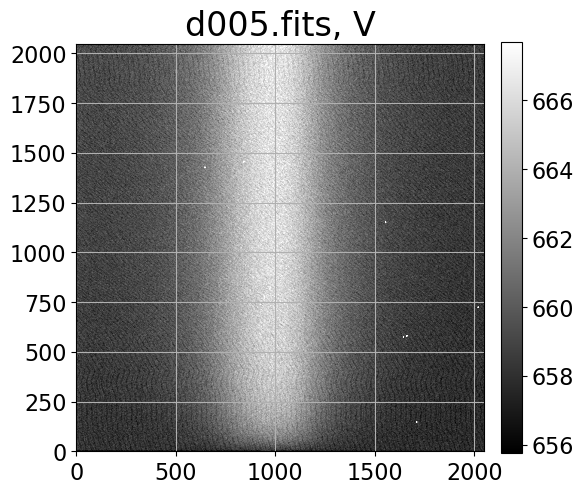

...

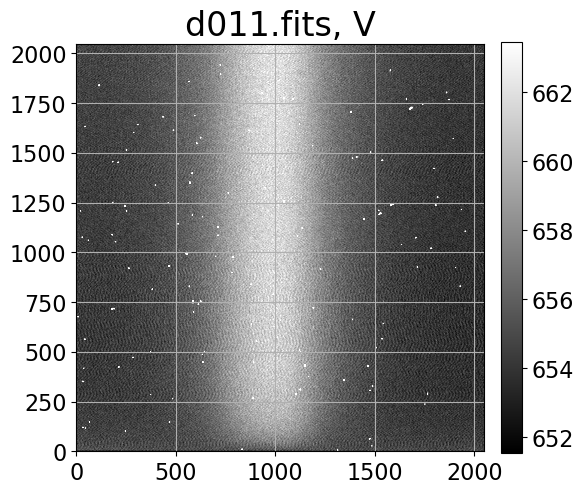

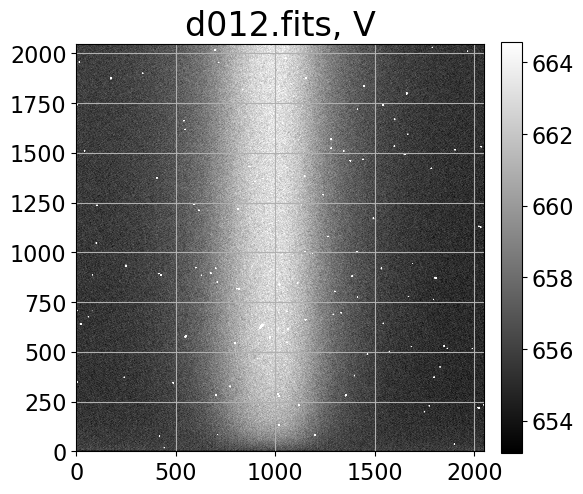

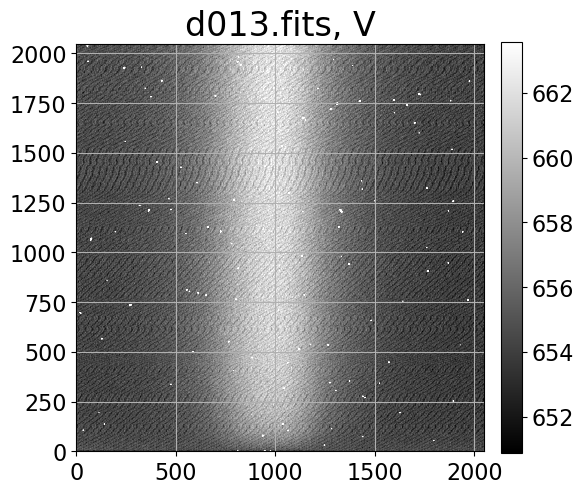

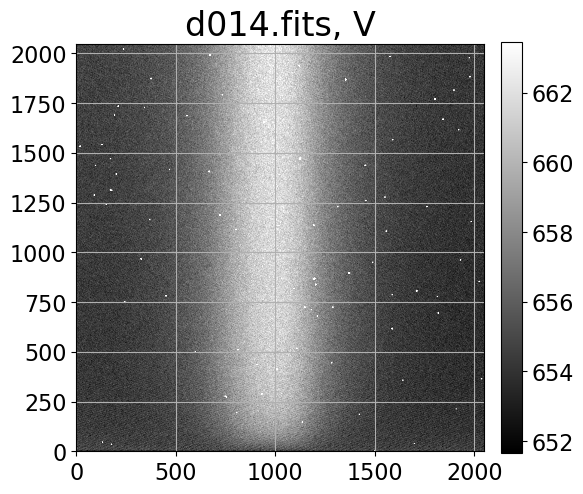

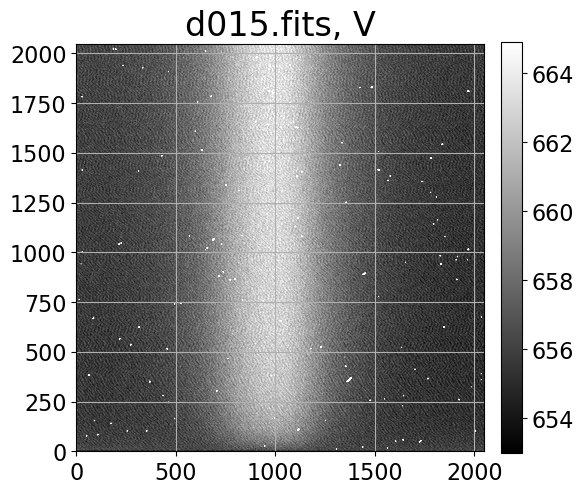

In [399]:
for i in range(15):
    dark = CCDData.read(dark_files[i],unit='adu') # this is how CCDPROC reads in one fits image

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    show_image(dark.data[:,c0:c1], cmap='gray', ax=ax, fig=fig)
    ax.set_title(dark_files[i][-9:]+', V') # index filename to exclude long directory
    plt.tight_layout()
    plt.show()

In [393]:
def generate_dark_frames(n_frames, dark_rate = 0, noise = 0, gain = 1, exposure = 10, image_size = 500):
    base_image = np.zeros([image_size, image_size])
    darks = np.zeros([n_frames, image_size, image_size])
    
    for i in range(15): #I wanted to create a new variable name for each dark, but am not sure how to do this. 
        d = {i}
        for x in range(i):
            d["string{0}".format(x)] = "Hello"